We want to fool our model into predicting a class of our choice. In this notebook, we will learn how to launch a targeted PGD-based attack on EfficientNet and its Adversarial Propagation (AdvProp) variant by launching a targeted PGD-based attack (Projected Gradient Descent).

We will first train a flower classification model using transfer learning. We will be using the pre-trained weights of a EfficientNet and its AdvProp variant. We will then launch a targeted attack on the their trained model.

Note: EfficientNet models in `tf.keras.applications` take care of normalization as a part of in-model preprocessing. So, we don't need to apply any pixel scaling beforehand.

Note that the purpose of this notebook is to show a workflow and not to train a SoTA model.

<a href="https://colab.research.google.com/github/sayakpaul/Adversarial-Examples-in-Deep-Learning/blob/master/Adversarial_Examples_EfficientNet_AdvProp.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Initial setup

In [26]:
!pip install tensorflow-gpu==2.8.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 497.6/497.6 MB 16.7 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 14.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.8/5.8 MB 14.5 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 14.1 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 781.3/781.3 kB 15.3 MB/s eta 0:00:00
  Attempting uninstall: keras
    Found existing installation: keras 3.6.0
    Uninstalling keras-3.6.0:
      Successfully uninstalled keras-3.6.0
  Attempting uninstall: tensorboard-data-server
    Found existing installation: tensorboard-data-server 0.7.2
    Uninstalling tensorboard-data-server-0.7.2:
      Successfully uninstalled tensorboard-data-server-0.7.2
  Attempting uninstall: google-auth-oauthlib
    Found existing installation: google-auth-oauthlib 1.0.0
    Uninstalling google-auth-oauthlib-1.0.0:
      Successfully uninstalled google-auth-oauthlib-1.0.0
  A

In [1]:
# TensorFlow version
import tensorflow as tf
print(tf.__version__)

2024-10-24 18:05:41.641549: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2024-10-24 18:05:41.641563: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


2.8.0


In [2]:
# Which GPU?
!nvidia-smi

Thu Oct 24 18:05:44 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.183.01             Driver Version: 535.183.01   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce RTX 4080        Off | 00000000:01:00.0  On |                  N/A |
|  0%   40C    P8               6W / 320W |      3MiB / 16376MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [6]:
!pip install tensorflow-datasets

  Preparing metadata (setup.py) ... done
  Using cached toml-0.10.2-py2.py3-none-any.whl.metadata (7.1 kB)
  Using cached docstring_parser-0.16-py3-none-any.whl.metadata (3.0 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 18.0 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 11.5 MB/s eta 0:00:00
Using cached toml-0.10.2-py2.py3-none-any.whl (16 kB)
Using cached docstring_parser-0.16-py3-none-any.whl (36 kB)
  Created wheel for promise: filename=promise-2.3-py3-none-any.whl size=21482 sha256=3cff4a40f22b549d77477dcc4d521494a368df183801e8c36e0db2c2731824ac
  Stored in directory: /home/quynhnl/.cache/pip/wheels/54/4e/28/3ed0e1c8a752867445bab994d2340724928aa3ab059c57c8db
Successfully built promise


In [3]:
# Other imports
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import *
from tensorflow.keras.models import *

import tensorflow_datasets as tfds
tfds.disable_progress_bar()

import matplotlib.pyplot as plt
import numpy as np
import random
import shutil
import time
import cv2
import os

# Fix the seeds
SEED = 666
tf.random.set_seed(SEED)
np.random.seed(SEED)

## Data collection

We first load a sample image dataset (flowers) which we will perturb in order to fool our pre-trained image classifier. We also specify a list that contains the dataset class labels.

In [4]:
# Gather Flowers dataset
train_ds, validation_ds = tfds.load(
    "tf_flowers",
    split=["train[:85%]", "train[85%:]"],
    as_supervised=True
)

# Specify the class labels, we would need this to create targeted attacks
CLASSES = ["daisy", "dandelion", "roses", "sunflowers", "tulips"]

2024-10-24 18:05:56.523201: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-10-24 18:05:56.523385: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/quynhnl/miniforge3/envs/fas/lib/python3.10/site-packages/cv2/../../lib64:
2024-10-24 18:05:56.523443: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublas.so.11'; dlerror: libcublas.so.11: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/quynhnl/miniforge3/envs/fas/lib/python3.10/site-packages/cv2/../../lib64:
2024-10-24 18:05:56.523487: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libc

2024-10-24 18:05:57.244238: W tensorflow/core/kernels/data/cache_dataset_ops.cc:768] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


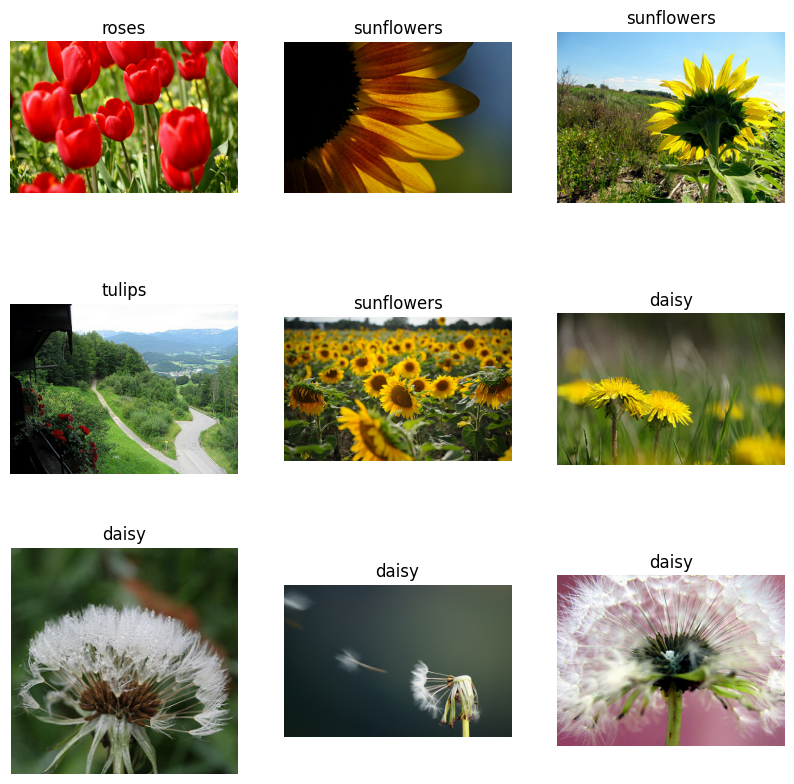

In [5]:
# Visualization
plt.figure(figsize=(10, 10))
for i, (image, label) in enumerate(train_ds.take(9)):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(image)
    plt.title(CLASSES[int(label)])
    plt.axis("off")

## Data preparation

In [6]:
# Image preprocessing utils, Function to preprocess an image for performing inference

SIZE = (224, 224)

def preprocess_image(image, label):
    # image = tf.image.convert_image_dtype(image, tf.float32)
    # The model includes the normalization steps
    image = tf.image.resize(image, SIZE)
    return (image, label)

In [7]:
# Construct TensorFlow dataset
BATCH_SIZE = 64
AUTO = tf.data.experimental.AUTOTUNE

train_ds = (
    train_ds
    .map(preprocess_image, num_parallel_calls=AUTO)
    .cache()
    .shuffle(1024)
    .batch(BATCH_SIZE)
    .prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
)

validation_ds = (
    validation_ds
    .map(preprocess_image, num_parallel_calls=AUTO)
    .cache()
    .batch(BATCH_SIZE)
    .prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
)

## Model utilities

In [8]:
# Reference: https://keras.io/examples/vision/image_classification_efficientnet_fine_tuning/
def get_training_model(base_model):
    inputs = Input(shape=(224, 224, 3))
    x = base_model(inputs, training=False)
    x = GlobalAveragePooling2D()(x)
    x = BatchNormalization()(x)

    top_dropout_rate = 0.2
    x = Dropout(top_dropout_rate)(x)
    x = Dense(5, activation="softmax")(x)
    classifier = Model(inputs=inputs, outputs=x)
    
    return classifier

def plot_progress(hist):
    plt.plot(hist.history["loss"], label="train_loss")
    plt.plot(hist.history["val_loss"], label="validation_loss")
    plt.plot(hist.history["accuracy"], label="training_accuracy")
    plt.plot(hist.history["val_accuracy"], label="validation_accuracy")
    plt.title("Training Progress")
    plt.ylabel("accuracy/loss")
    plt.xlabel("epoch")
    plt.legend(loc="upper left")
    plt.show()

Fetch the [AdvProp](https://arxiv.org/abs/1911.09665) training checkpoints for EfficientNetB0 and convert the checkpoints to `.h5`. 

In [13]:
!wget -q https://storage.googleapis.com/cloud-tpu-checkpoints/efficientnet/advprop/efficientnet-b0.tar.gz
!tar -xf efficientnet-b0.tar.gz

In [9]:
!wget -q https://raw.githubusercontent.com/yixingfu/tensorflow/updateweights/tensorflow/python/keras/applications/efficientnet_weight_update_util.py
!python efficientnet_weight_update_util.py --model b0 --notop --ckpt \
       efficientnet-b0/model.ckpt --o efficientnetb0_notop.h5

2024-10-24 18:06:05.388778: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/quynhnl/miniforge3/envs/fas/lib/python3.10/site-packages/cv2/../../lib64:
2024-10-24 18:06:05.388795: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2024-10-24 18:06:06.047246: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-10-24 18:06:06.047348: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/quynhnl/miniforge3/envs/fas/lib/python3.

## Training an EfficientNetB0 initialized with adversarial propagation (AdvProp) weights

In [11]:
# Load the EfficientNetB0 model but exclude the classification layers
# Note that the model was trained using AdvProp (https://arxiv.org/abs/1911.09665)
base_model_eb0_ap = EfficientNetB0(weights="efficientnetb0_notop.h5", include_top=False)
base_model_eb0_ap.trainable = False # We are not fine-tuning at this point
get_training_model(base_model_eb0_ap).summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetb0 (Functional)  (None, None, None, 1280)  4049571  
                                                                 
 global_average_pooling2d (G  (None, 1280)             0         
 lobalAveragePooling2D)                                          
                                                                 
 batch_normalization (BatchN  (None, 1280)             5120      
 ormalization)                                                   
                                                                 
 dropout (Dropout)           (None, 1280)              0         
                                                                 
 dense (Dense)               (None, 5)                 6405  

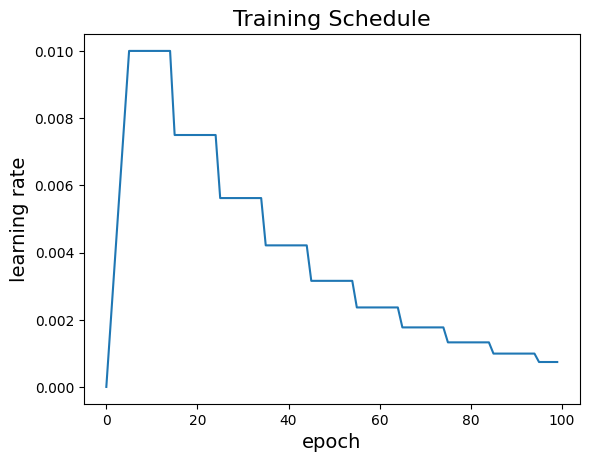

In [12]:
# CUSTOM LEARNING SCHEUDLE
# Reference: https://www.kaggle.com/cdeotte/how-to-compete-with-gpus-workshop
LR_START = 1e-5
LR_MAX = 1e-2
LR_RAMPUP_EPOCHS = 5
LR_SUSTAIN_EPOCHS = 0
LR_STEP_DECAY = 0.75

def lrfn(epoch):
    if epoch < LR_RAMPUP_EPOCHS:
        lr = (LR_MAX - LR_START) / LR_RAMPUP_EPOCHS * epoch + LR_START
    elif epoch < LR_RAMPUP_EPOCHS + LR_SUSTAIN_EPOCHS:
        lr = LR_MAX
    else:
        lr = LR_MAX * LR_STEP_DECAY**((epoch - LR_RAMPUP_EPOCHS - LR_SUSTAIN_EPOCHS)//10)
    return lr
    
lr2 = tf.keras.callbacks.LearningRateScheduler(lrfn, verbose=True)

rng = [i for i in range(100)]
y = [lrfn(x) for x in rng]
plt.plot(rng, y); 
plt.xlabel('epoch',size=14); plt.ylabel('learning rate',size=14)
plt.title('Training Schedule',size=16); plt.show()

In [13]:
# Early stopping callback
es = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss", patience=5, restore_best_weights=True
)


Epoch 1: LearningRateScheduler setting learning rate to 1e-05.
Epoch 1/30
49/49 [==============================] - 28s 542ms/step - loss: 2.3733 - accuracy: 0.1856 - val_loss: 1.6950 - val_accuracy: 0.2200 - lr: 1.0000e-05

Epoch 2: LearningRateScheduler setting learning rate to 0.0020080000000000002.
Epoch 2/30
49/49 [==============================] - 27s 546ms/step - loss: 0.6840 - accuracy: 0.7715 - val_loss: 0.4046 - val_accuracy: 0.8673 - lr: 0.0020

Epoch 3: LearningRateScheduler setting learning rate to 0.004006.
Epoch 3/30
49/49 [==============================] - 27s 545ms/step - loss: 0.2841 - accuracy: 0.9035 - val_loss: 0.3212 - val_accuracy: 0.9036 - lr: 0.0040

Epoch 4: LearningRateScheduler setting learning rate to 0.006004000000000001.
Epoch 4/30
49/49 [==============================] - 27s 552ms/step - loss: 0.1940 - accuracy: 0.9349 - val_loss: 0.2785 - val_accuracy: 0.9000 - lr: 0.0060

Epoch 5: LearningRateScheduler setting learning rate to 0.008002.
Epoch 5/30
49/4

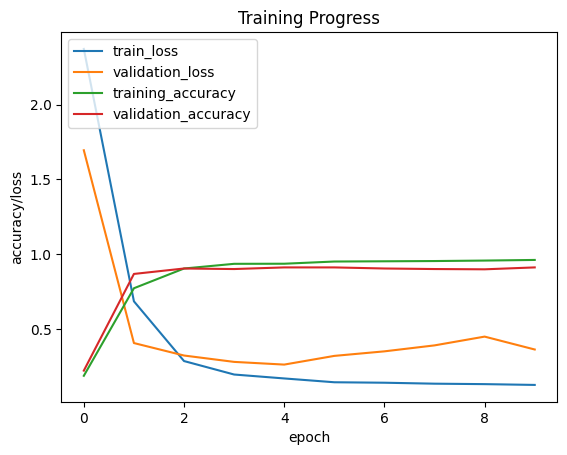

In [14]:
# Train the model
model_eb0_ap = get_training_model(base_model_eb0_ap)
model_eb0_ap.compile(loss="sparse_categorical_crossentropy", optimizer="adam", metrics=["accuracy"])
start = time.time()
h = model_eb0_ap.fit(train_ds,
              validation_data=validation_ds,
              epochs=30,
              callbacks=[lr2, es])
print("Total training time (seconds): ",time.time()-start)
plot_progress(h)

## Training an EfficientNetB0 initialized with ImageNet weights

In [15]:
# Load the EfficientNetB0 model but exclude the classification layers
# This time the weights are from traditional ImageNet pre-training
base_model_eb0 = EfficientNetB0(weights="imagenet", include_top=False)
base_model_eb0.trainable = False # We are not fine-tuning at this point


Epoch 1: LearningRateScheduler setting learning rate to 1e-05.
Epoch 1/30
49/49 [==============================] - 29s 571ms/step - loss: 1.8281 - accuracy: 0.3510 - val_loss: 1.4806 - val_accuracy: 0.3764 - lr: 1.0000e-05

Epoch 2: LearningRateScheduler setting learning rate to 0.0020080000000000002.
Epoch 2/30
49/49 [==============================] - 27s 559ms/step - loss: 0.6409 - accuracy: 0.7888 - val_loss: 0.3971 - val_accuracy: 0.8745 - lr: 0.0020

Epoch 3: LearningRateScheduler setting learning rate to 0.004006.
Epoch 3/30
49/49 [==============================] - 27s 556ms/step - loss: 0.2904 - accuracy: 0.9019 - val_loss: 0.2936 - val_accuracy: 0.9055 - lr: 0.0040

Epoch 4: LearningRateScheduler setting learning rate to 0.006004000000000001.
Epoch 4/30
49/49 [==============================] - 27s 559ms/step - loss: 0.2094 - accuracy: 0.9240 - val_loss: 0.2420 - val_accuracy: 0.9164 - lr: 0.0060

Epoch 5: LearningRateScheduler setting learning rate to 0.008002.
Epoch 5/30
49/4

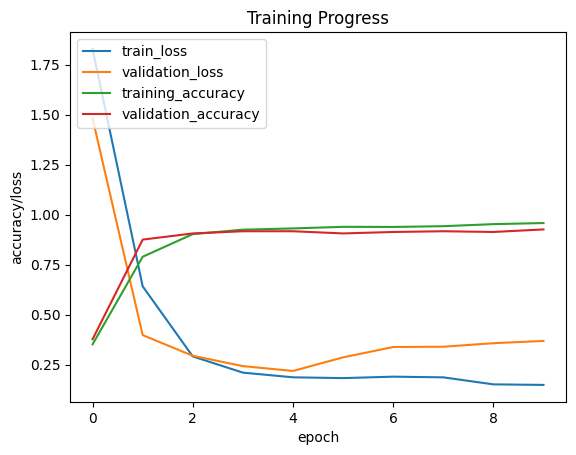

In [16]:
# Train the model
model_eb0 = get_training_model(base_model_eb0)
model_eb0.compile(loss="sparse_categorical_crossentropy", optimizer="adam", metrics=["accuracy"])
start = time.time()
h = model_eb0.fit(train_ds,
              validation_data=validation_ds,
              epochs=30,
              callbacks=[lr2, es])
print("Total training time (seconds): ",time.time()-start)
plot_progress(h)

## Plotting sample predictions

In [17]:
# Utility to plot sample predictions 
def plot_predictions(images, labels, probability):
    plt.figure(figsize=(15, 15))
    for i, image in enumerate(images):
        ax = plt.subplot(4, 4, i + 1)
        plt.imshow(image.numpy().astype("uint8"))
        predicted_label = CLASSES[np.argmax(probability[i])]
        maximum_probability = "{:.3f}".format(max(probability[i]))
        text = "{} with probability: {}".format(predicted_label, maximum_probability) + \
            "\nGround-truth: {}".format(CLASSES[int(labels[i])])
        plt.title(text)
        plt.axis("off")
    plt.show()

### Inference with the regular EfficienNet model

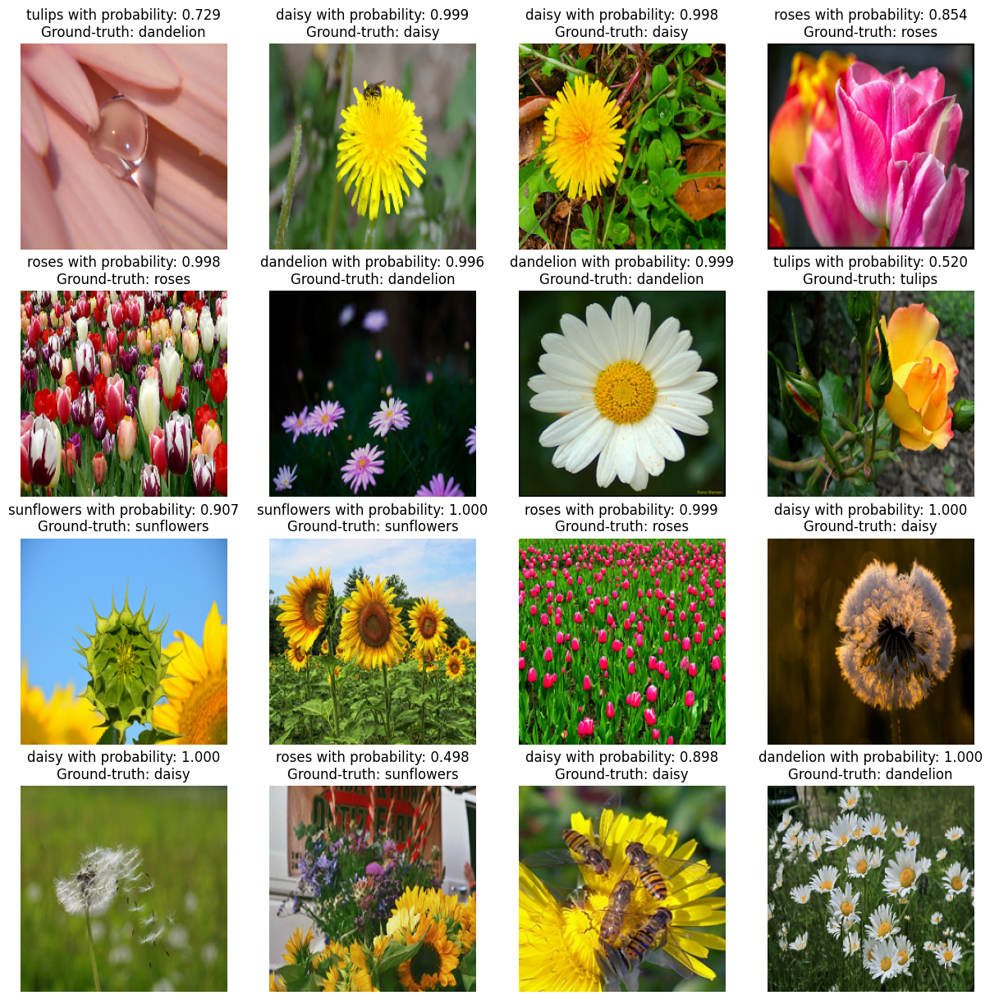

In [18]:
# Let's run inference on a batch of images from the validation set
(batch_images, batch_labels) = next(iter(validation_ds))
predictions = model_eb0.predict(batch_images)
plot_predictions(batch_images[:16], batch_labels[:16], predictions[:16])

### Inference with the AdvProp weights initialized EfficientNet model

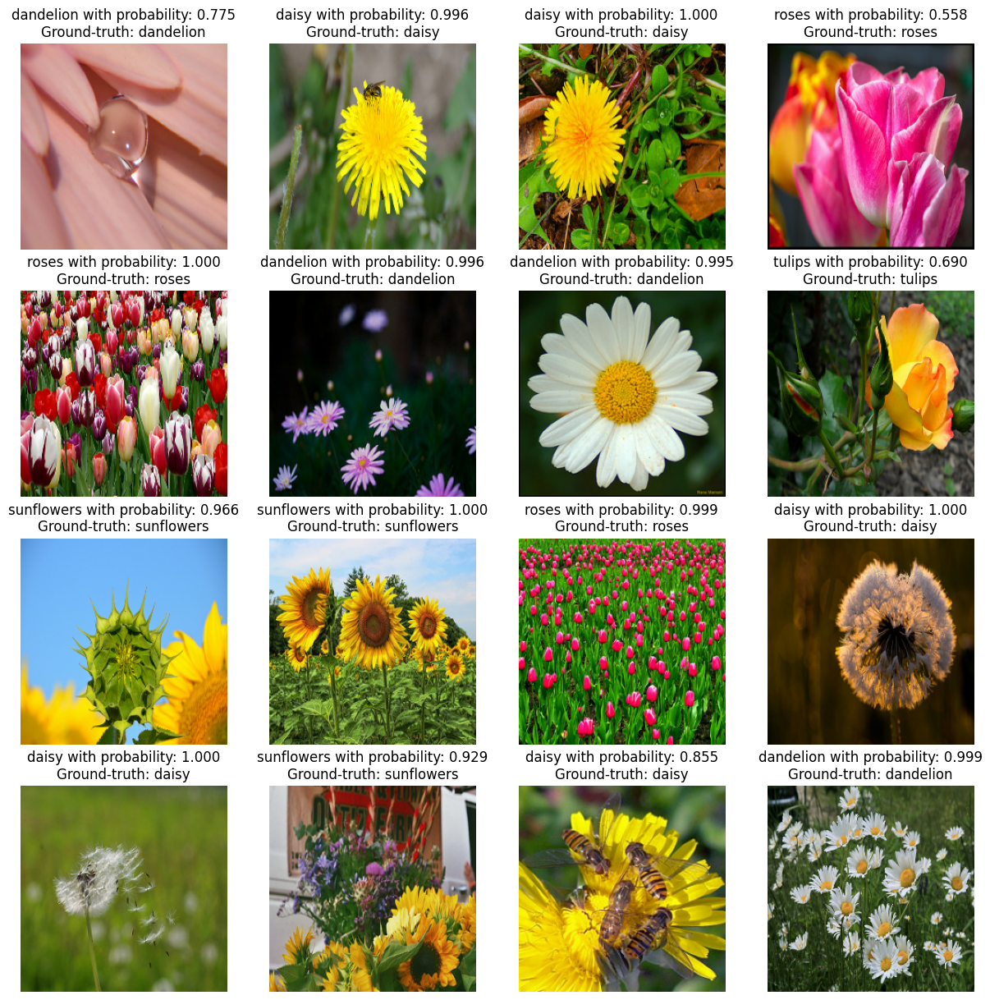

In [19]:
# Let's run inference on a batch of images from the validation set
(batch_images, batch_labels) = next(iter(validation_ds))
predictions = model_eb0_ap.predict(batch_images)
plot_predictions(batch_images[:16], batch_labels[:16], predictions[:16])

Let's now write our utility functions for launching a targeted PGD-based attack.

## Utilities for creating a targeted adversarial example

In [20]:
#@title
EPS = 2./255

def clip_eps(delta_tensor):
    return tf.clip_by_value(delta_tensor, clip_value_min=-EPS, clip_value_max=EPS)

In this attack we will use PGD to simply maximize the loss for the given (true) class and at the same time minimize the loss for the target class such that the visual semantics of our input image does not get hampered.

In [26]:
#@title
def generate_adversaries_targeted(model, image_tensor, delta, 
    true_index, target_index):
    # Loss and optimizer
    scc_loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
    optimizer = tf.keras.optimizers.Adam(learning_rate=5e-3)

    for t in range(350):
        plt.show()
        with tf.GradientTape() as tape:
            tape.watch(delta)
            inp = (image_tensor + delta)
            predictions = model(inp, training=False)
            loss = (- scc_loss(tf.convert_to_tensor([true_index]), predictions) + 
	                    scc_loss(tf.convert_to_tensor([target_index]), predictions))
            if t % 20 == 0:
                print(t, loss.numpy())
                plt.imshow(50*delta.numpy().squeeze()+0.5)
            
        # Get the gradients
        gradients = tape.gradient(loss, delta)
        
        # Update the weights
        optimizer.apply_gradients([(gradients, delta)])

        # Project the delta back (l-infinite norm)
        delta.assign_add(clip_eps(delta))

    return delta

In [30]:
#@title
def perturb_image(model, image, true, target):
    print("Before adversarial attack")
    # Generate predictions before any adversaries
    probabilities = model.predict(image)
    class_index = np.argmax(probabilities)
    print("Ground-truth label: {} predicted label: {}".format(CLASSES[true], CLASSES[class_index]))
    
    # Initialize the perturbation quantity
    image_tensor = tf.constant(image, dtype=tf.float32)
    delta = tf.Variable(tf.zeros_like(image_tensor), trainable=True)

    # Get the adversary vector, Get the learned delta and display it
    delta_tensor = generate_adversaries_targeted(model, image_tensor, delta, true, target)
    plt.imshow(50*delta_tensor.numpy().squeeze()+0.5)
    plt.show()

    # See if the image changes
    plt.imshow((image_tensor + delta_tensor).numpy().astype("uint8").squeeze())
    plt.show()

    # Generate prediction
    perturbed_image = (image_tensor + delta_tensor)
    print("After adversarial attack")
    
    # Generate predictions
    preds = model.predict(perturbed_image)[0]
    i = np.argmax(preds)
    pred_label = CLASSES[i]

    print("Predicted label: {}".format(pred_label))
    cv2.imwrite("perturbed_image.png", perturbed_image.numpy().squeeze())

# Launching a targeted attack!

Turning a dandelion (last image from the figure above) to a tulip. 

In [31]:
# Pick an image from the validation set
index = 15
sample_val_image = (batch_images[index])
sample_val_image = np.expand_dims(sample_val_image, 0)

Before adversarial attack
Ground-truth label: dandelion predicted label: dandelion
0 11.80617


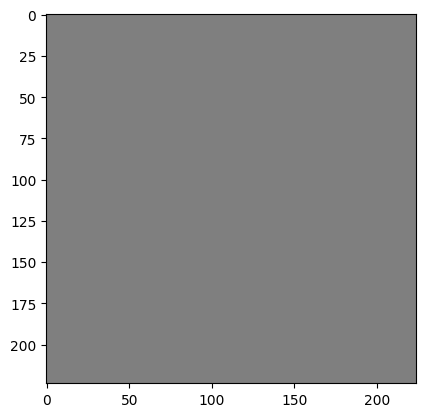

20 9.7402


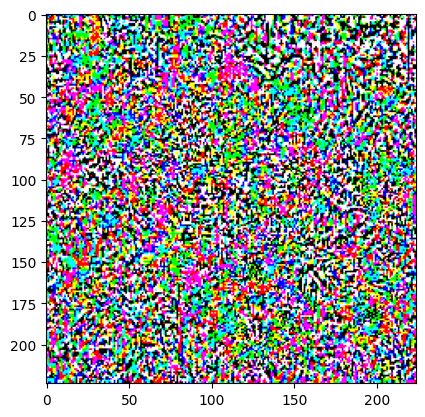

40 8.025206


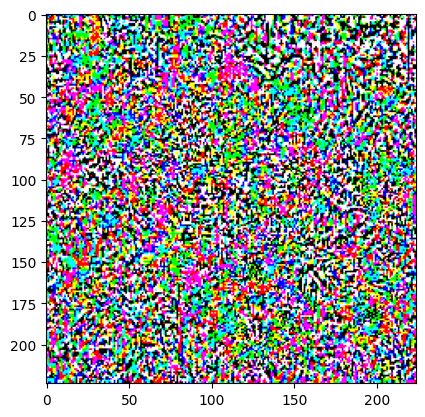

60 6.6909256


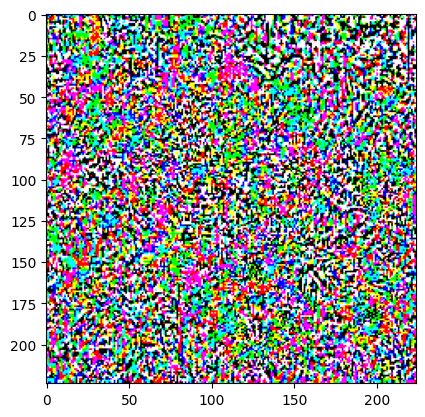

80 5.6328077


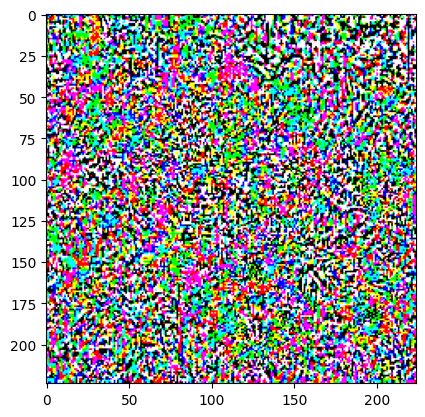

100 4.761692


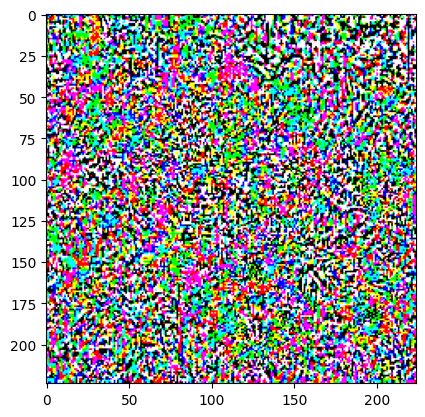

120 4.0161886


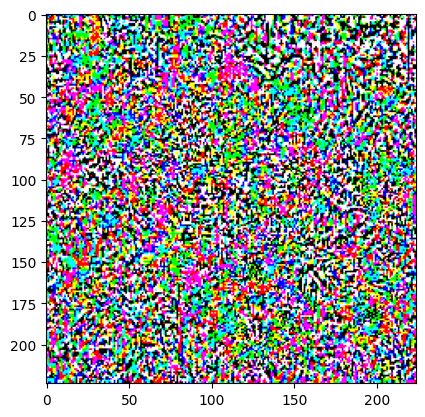

140 3.3541133


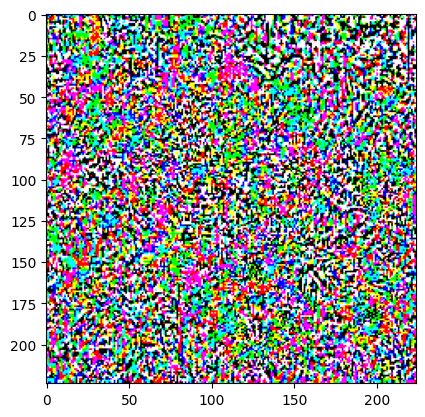

160 2.746016


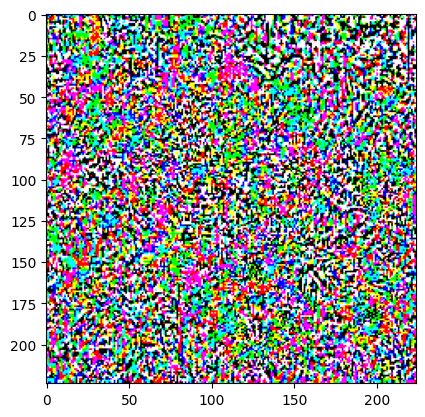

180 2.168486


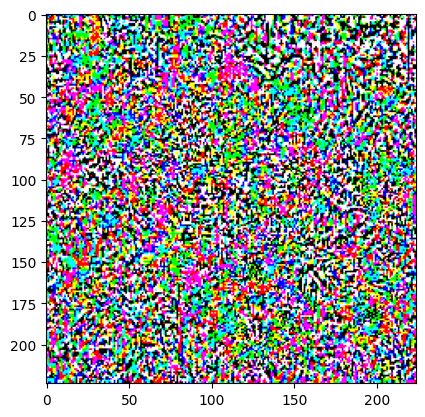

200 1.6019115


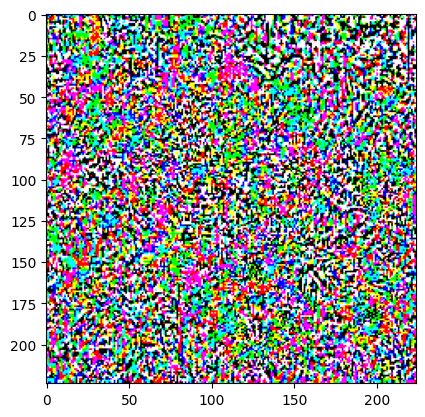

220 1.0301247


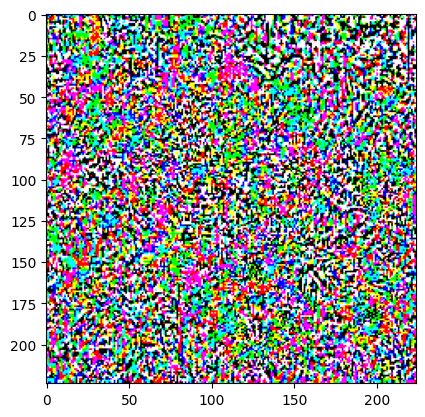

240 0.43948627


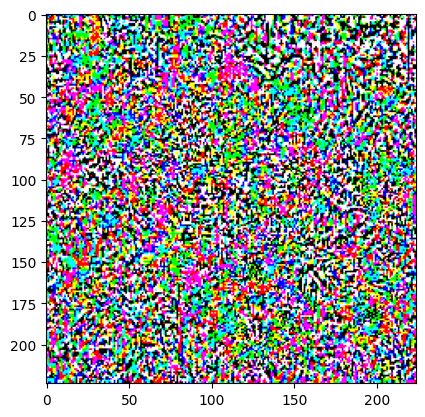

260 -0.18277907


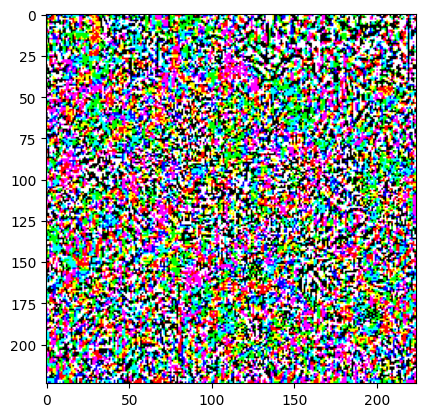

280 -0.8503139


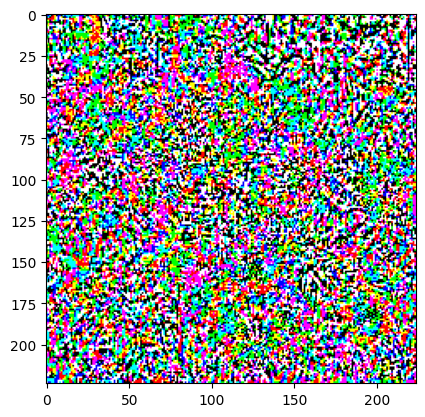

300 -1.5754075


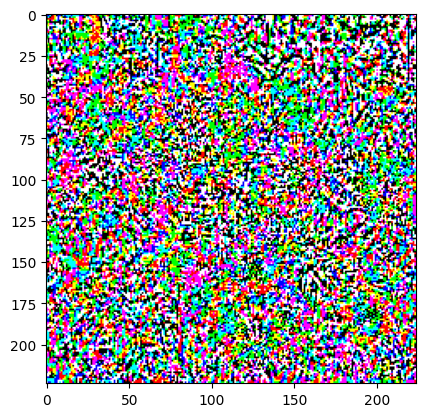

320 -2.3745267


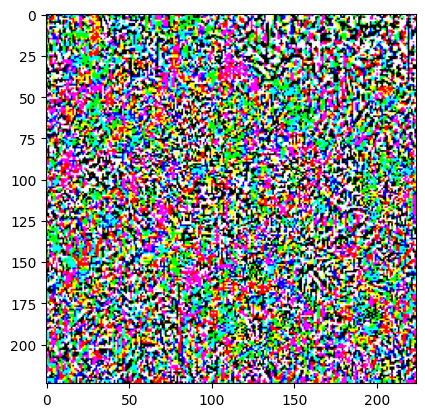

340 -3.268293


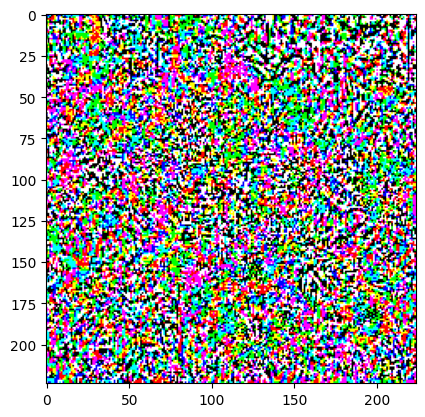

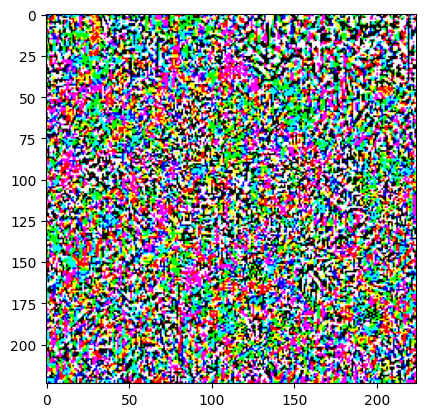

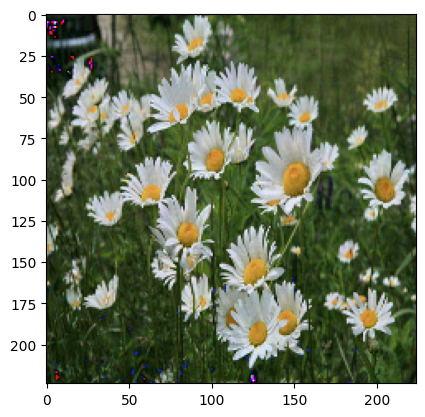

After adversarial attack
Predicted label: tulips


In [32]:
#@title EfficientNetB0 with ImageNet initialization
# Tulips class index 4
perturb_image(model_eb0, sample_val_image, batch_labels[index].numpy(), 4)

Before adversarial attack
Ground-truth label: dandelion predicted label: dandelion
0 9.56041
20 8.557842
40 7.55062
60 6.544447
80 5.53211
100 4.51128
120 3.4844918
140 2.4581115
160 1.4304585
180 0.3835287
200 -0.69571346
220 -1.8086791
240 -2.9511254
260 -4.1012073
280 -5.2302623
300 -6.3238263
320 -7.385362
340 -8.431145


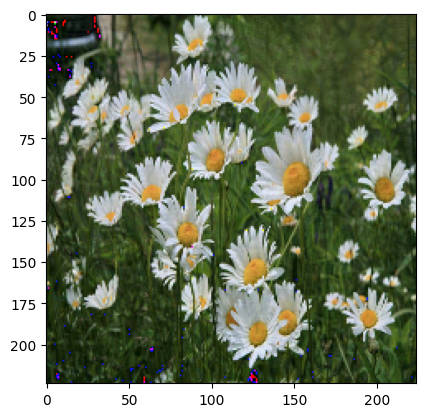

After adversarial attack
Predicted label: tulips


In [25]:
#@title EfficientNetB0 with AdvProp initialization
perturb_image(model_eb0_ap, sample_val_image, batch_labels[index].numpy(), 4)